## David Kuralt
## Final Project
## COMP 4449, Spring 2022
## Claudio Delrieux, professor and facilitator

# Exploring the data and imputing missing values

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pandas.tseries.offsets import DateOffset
sns.set()

# read in the data
dodgers_df = pd.read_csv("dodgers_data.data", header=None, names=["date-time", "number_of_cars"])

print(dodgers_df.head())

        date-time  number_of_cars
0  4/10/2005 0:00              -1
1  4/10/2005 0:05              -1
2  4/10/2005 0:10              -1
3  4/10/2005 0:15              -1
4  4/10/2005 0:20              -1


In [2]:
# -1 indicates missing data; replace -1 with np.nan
dodgers_df["number_of_cars"] = dodgers_df["number_of_cars"].replace(-1, np.nan)

# change date-time column to datetime type
dodgers_df["date-time"] = dodgers_df["date-time"].astype("datetime64")

# make the date-time column the index
dodgers_df = dodgers_df.set_index("date-time")

# make explicit that data are collected at 5-minute intervals
# and insert rows if any indices are missing
#dodgers_df = dodgers_df.asfreq(DateOffset(minutes=5))

# there are blocks of missing data at the beginning and at the end of
# the time series. We want to drop these rows rather than try to impute.
dodgers_df.first_valid_index()

Timestamp('2005-04-11 07:35:00')

In [3]:
dodgers_df.last_valid_index()

Timestamp('2005-10-01 00:05:00')

In [4]:
# trim the NaN values from the beginning and end of our time series
dodgers_df = dodgers_df.loc["2005-04-11 07:35:00":"2005-10-01 00:05:00"]

# create a new column to identify values we must impute
# we will use this new column to color in imputed values
# on our visualizations
dodgers_df["data"] = dodgers_df["number_of_cars"].isna()
dodgers_df["data"] = dodgers_df["data"].replace({False:"actual", True:"imputed"})

# There does not appear to be any trend in the data,
# so to impute missing values, we will go back or forward
# in one-week increments until we find a valid value
# for number_of_cars

from datetime import timedelta

def impute_3wk(x, df=dodgers_df): # if we have to check three weeks away for a non-nan value
    if x.name-timedelta(days=21) in df.index:
            x["number_of_cars"] = \
                df.loc[x.name-timedelta(days=21)].at["number_of_cars"]
            return x
    else:
        x["number_of_cars"] = \
            df.loc[x.name+timedelta(days=21)].at["number_of_cars"]
        return x

def impute_2wk(x, df=dodgers_df): # if we have to check two weeks away for a non-nan value
    if x.name-timedelta(days=14) in df.index:
        if np.isnan(df.loc[x.name-timedelta(days=14)]["number_of_cars"]):
            x = impute_3wk(x)
            return x
        else:
           x["number_of_cars"] = \
                df.loc[x.name-timedelta(days=14)].at["number_of_cars"]
        return x
    else:
        if np.isnan(df.loc[x.name+timedelta(days=14)]["number_of_cars"]):
            x = impute_3wk(x)
            return x
        else:
            x["number_of_cars"] = \
                df.loc[x.name+timedelta(days=14)].at["number_of_cars"]
        return x
    
def impute_1wk(x, df=dodgers_df): # if we have to check one week away for a non-nan value
    if np.isnan(x["number_of_cars"]):
        if x.name-timedelta(days=7) in df.index:
            if np.isnan(df.loc[x.name-timedelta(days=7)]["number_of_cars"]):
                x = impute_2wk(x)
                return x
            else:
               x["number_of_cars"] = \
                    df.loc[x.name-timedelta(days=7)].at["number_of_cars"]
            return x
        else:
            if np.isnan(df.loc[x.name+timedelta(days=7)]["number_of_cars"]):
                x = impute_2wk(x)
                return x
            else:
                x["number_of_cars"] = \
                    df.loc[x.name+timedelta(days=7)].at["number_of_cars"]
            return x
    else:
        return x

dodgers_df = dodgers_df.apply(func=impute_1wk, axis=1)

# One-day moving average and median, autocovariance and variogram

In [5]:
# calculating a centered moving one-day average
# and a centered moving one-day median

def oneDay_moving_avg(x, df=dodgers_df): # moving average
    lookBack = x.name - timedelta(hours=12)
    lookAhead = x.name + timedelta(hours=12)
    if lookBack not in df.index or lookAhead not in df.index:
        return np.nan
    else:
        return np.mean(df["number_of_cars"].loc[lookBack:lookAhead])
    
def oneDay_moving_med(x, df=dodgers_df): # moving median
    lookBack = x.name - timedelta(hours=12)
    lookAhead = x.name + timedelta(hours=12)
    if lookBack not in df.index or lookAhead not in df.index:
        return np.nan
    else:
        return np.median(df["number_of_cars"].loc[lookBack:lookAhead])
    
dodgers_df["oneDay_movingAvg"] = dodgers_df.apply(oneDay_moving_avg, axis=1)
dodgers_df["oneDay_movingMed"] = dodgers_df.apply(oneDay_moving_med, axis=1)

In [6]:
# adding a weekday column to dodgers_df
from datetime import date

dodgers_df["weekday"] = dodgers_df.index.date
dodgers_df["weekday"] = dodgers_df["weekday"].apply(lambda x: pd.to_datetime(x).dayofweek)
dodgers_df = dodgers_df[["weekday", "number_of_cars", "data", 
                         "oneDay_movingAvg", "oneDay_movingMed"]]

# adding a weekday average column to dodgers_df:
# grouping dodgers_df by weekday and calculating the 
# mean of number_of_cars

# creating a Pandas Series weekdayAvg
weekdayAvg = dodgers_df.groupby("weekday")["number_of_cars"].mean()
weekdayAvg.rename("weekdayAvg", inplace=True)

# adjusting the index of dodgers_df so we can join
# dodgers_df to weekdayAvg
dodgers_df = dodgers_df.reset_index()
dodgers_df = dodgers_df.set_index("weekday")
dodgers_df = dodgers_df.join(weekdayAvg, how="inner")

# after joining, we change dodgers_df.index
# to what it was before the joining
dodgers_df = dodgers_df.reset_index()
dodgers_df = dodgers_df.set_index("date-time")
dodgers_df.sort_index(inplace=True)

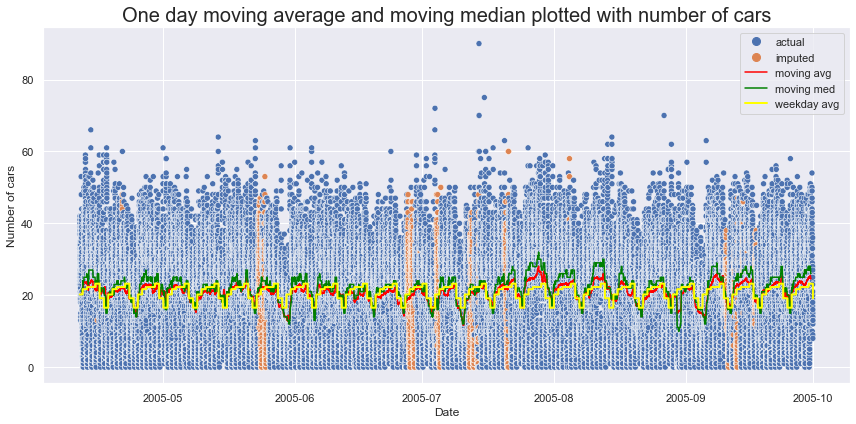

In [7]:
# showing number_of_cars scatterplot and superimposing
# centered moving one-day mean and median
# along with weekday average
from matplotlib.lines import Line2D

fig, ax = plt.subplots(1, 1, figsize=(12, 6))
sns.lineplot(x=dodgers_df.index, y=dodgers_df["oneDay_movingAvg"], linestyle="-", color="red", ax=ax)
sns.lineplot(x=dodgers_df.index, y=dodgers_df["oneDay_movingMed"], linestyle="-", color="green", ax=ax)
sns.lineplot(x=dodgers_df.index, y=dodgers_df["weekdayAvg"], linestyle="-", linewidth=2, color="yellow", ax=ax)
sns.scatterplot(x=dodgers_df.index, y=dodgers_df["number_of_cars"], hue=dodgers_df["data"], ax=ax)
ax.set_xlabel("Date")
ax.set_ylabel("Number of cars")
ax.set_title("One day moving average and moving median plotted with number of cars", size=20)

# creating the legend
blueDot = Line2D([], [], color=sns.color_palette()[0], marker="o", linestyle="None", markersize=8, label="actual")
pinkDot = Line2D([], [], color=sns.color_palette()[1], marker="o", linestyle="None", markersize=8, label="imputed")
redLine = Line2D([], [], color="red", marker="None", linestyle="-", label="moving avg")
greenLine = Line2D([], [], color="green", marker="None", linestyle="-", label="moving med")
yellowLine = Line2D([], [], color="yellow", marker="None", linestyle="-", linewidth=2, label="weekday avg")
ax.legend(handles=[blueDot, pinkDot, redLine, greenLine, yellowLine])

plt.tight_layout()

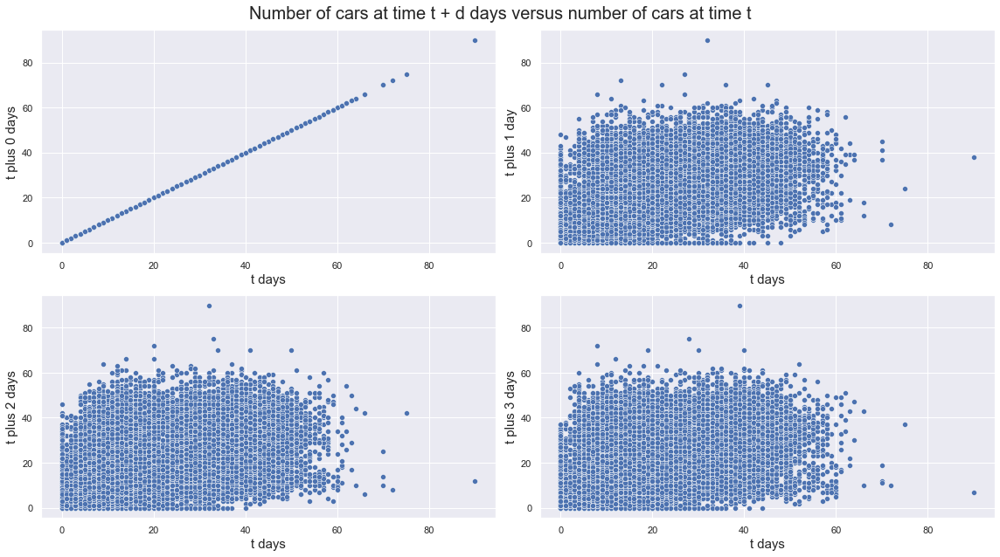

In [8]:
# looking at scatterplots for number of cars at time t+d days versus number of cars
# at t days
T = len(dodgers_df)
k = [288*i for i in range(4)]

fig, ax = plt.subplots(2, 2, figsize=(16,9))

for i in range(4):
    x = dodgers_df["number_of_cars"].loc[:dodgers_df.index[T-k[i]-1]].to_numpy()
    y = dodgers_df["number_of_cars"].loc[dodgers_df.index[k[i]]:].to_numpy()
    sns.scatterplot(x=x, y=y, ax=ax[i//2, (1-(-1)**i)//2]) 

ax[0,0].set_xlabel("t days", size=15)
ax[0,1].set_xlabel("t days", size=15)
ax[1,0].set_xlabel("t days", size=15)
ax[1,1].set_xlabel("t days", size=15)
ax[0,0].set_ylabel("t plus 0 days", size=15)
ax[0,1].set_ylabel("t plus 1 day", size=15)
ax[1,0].set_ylabel("t plus 2 days", size=15)
ax[1,1].set_ylabel("t plus 3 days", size=15)
plt.suptitle("Number of cars at time t + d days versus number of cars at time t", size=20)

plt.tight_layout()

In [9]:
# an estimate of the autocovariance function for
# lags from 0 to 12,000

def autoCovariance(k, df=dodgers_df):
    T = len(df)
    y_bar = np.mean(df["number_of_cars"])
    a = df["number_of_cars"].loc[:df.index[T-1-k]].to_numpy()
    b = df["number_of_cars"].loc[df.index[k]:].to_numpy()
    autoCovEst = (1/T)*np.sum((a-y_bar)*(b-y_bar))
    return autoCovEst
    
autoCovFunc = [autoCovariance(i) for i in range(12001)]

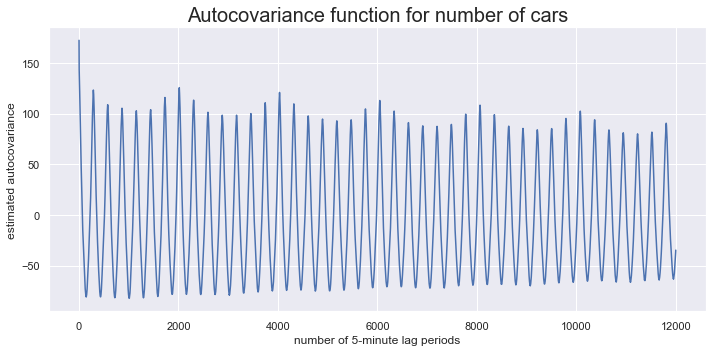

In [10]:
# a graph of the autocovariance function
fig, ax = plt.subplots(1, 1, figsize=(10,5))
sns.lineplot(x=range(12001), y=autoCovFunc, ax=ax)
ax.set_xlabel("number of 5-minute lag periods")
ax.set_ylabel("estimated autocovariance")
ax.set_title("Autocovariance function for number of cars", size=20)
plt.tight_layout()

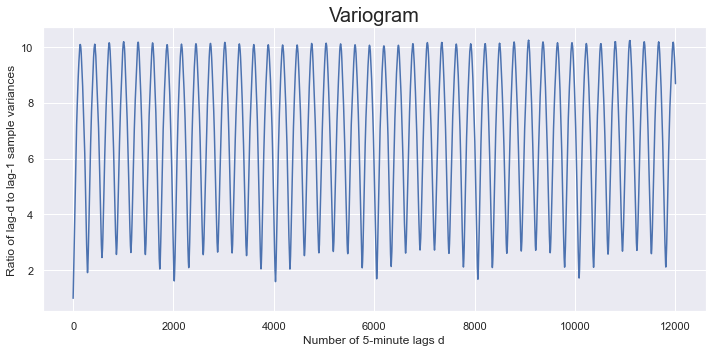

In [11]:
# calcuation of a variogram, a ratio of lag-k to lag-1 sample variances versus k
def variogram_k(k, df=dodgers_df):
    T = len(df)
    a = df["number_of_cars"].loc[:df.index[T-1-k]].to_numpy()
    b = df["number_of_cars"].loc[df.index[k]:].to_numpy()
    return np.var(b-a, ddof=1)

denom = variogram_k(1)

varioList = [variogram_k(i)/denom for i in range(1,12001)]

# sketching the variogram
fig, ax = plt.subplots(1, 1, figsize=(10,5))
sns.lineplot(x=range(1,12001), y=varioList, ax=ax)
ax.set_xlabel("Number of 5-minute lags d")
ax.set_ylabel("Ratio of lag-d to lag-1 sample variances")
ax.set_title("Variogram", size=20)
plt.tight_layout()

# Removing seasonality through differencing

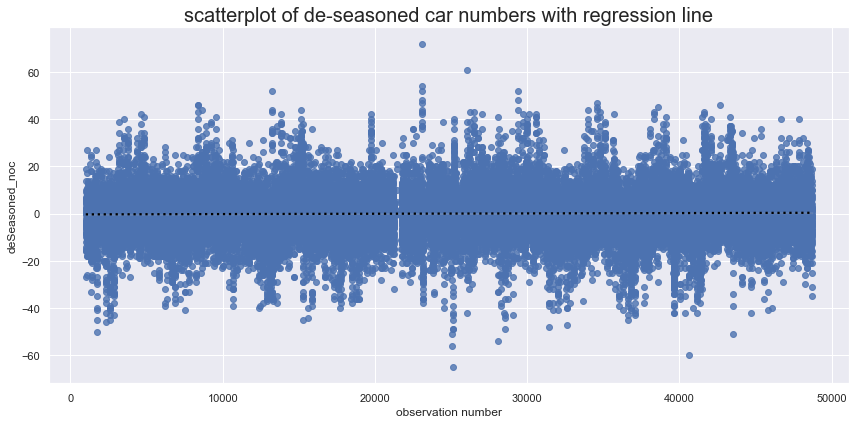

In [12]:
def deSeason(x, df=dodgers_df): # this is the differencing function
    lookBack = x.name - timedelta(days=3.5)
    lookAhead = x.name + timedelta(days=3.5)
    if lookBack not in df.index or lookAhead not in df.index:
        return np.nan
    else:
        return dodgers_df["number_of_cars"].loc[lookAhead] -\
                        dodgers_df["number_of_cars"].loc[lookBack]

dodgers_df["deSeasoned_noc"] = dodgers_df.apply(deSeason, axis=1)

# calcuating centered one day moving average and median of deSeasoned_noc
def deSeason_moving_avg(x, df=dodgers_df):
    lookBack = x.name - timedelta(hours=12)
    lookAhead = x.name + timedelta(hours=12)
    if (lookBack not in df.index or np.isnan(df["deSeasoned_noc"].loc[lookBack])) or\
        (lookAhead not in df.index or np.isnan(df["deSeasoned_noc"].loc[lookAhead])):
        return np.nan
    else:
        return np.mean(df["deSeasoned_noc"].loc[lookBack:lookAhead])
    
def deSeason_moving_med(x, df=dodgers_df):
    lookBack = x.name - timedelta(hours=12)
    lookAhead = x.name + timedelta(hours=12)
    if (lookBack not in df.index or np.isnan(df["deSeasoned_noc"].loc[lookBack])) or\
        (lookAhead not in df.index or np.isnan(df["deSeasoned_noc"].loc[lookAhead])):
        return np.nan
    else:
        return np.median(df["deSeasoned_noc"].loc[lookBack:lookAhead])
    
dodgers_df["deSeason_movingAvg"] = dodgers_df.apply(deSeason_moving_avg, axis=1)
dodgers_df["deSeason_movingMed"] = dodgers_df.apply(deSeason_moving_med, axis=1)

# adding a weekday average column for deSeasoned_noc
# using the same procedures as when we added a column
# for weekday average number_of_cars
deSeasonWeekdayAvg = dodgers_df.groupby("weekday")["deSeasoned_noc"].mean()
deSeasonWeekdayAvg.rename("deSeasonWeekdayAvg", inplace=True)

dodgers_df = dodgers_df.reset_index()
dodgers_df = dodgers_df.set_index("weekday")

dodgers_df = dodgers_df.join(deSeasonWeekdayAvg, how="inner")

dodgers_df = dodgers_df.reset_index()
dodgers_df = dodgers_df.set_index("date-time")
dodgers_df.sort_index(inplace=True)

# a scatterplot of deSeasoned_noc and its trendline
fig, ax = plt.subplots(1, 1, figsize=(12,6))
sns.regplot(x=[i for i in range(len(dodgers_df))], y=dodgers_df["deSeasoned_noc"], 
            line_kws={"color":"black", "linestyle":":"}, ax=ax)
ax.set_xlabel("observation number")
ax.set_title("scatterplot of de-seasoned car numbers with regression line", size=20)
plt.tight_layout()

In [13]:
# importing the events.events text file,
# building its index from the date and game
# end time, rounding the end time to the
# nearest five minutes
import re

events_df = pd.read_csv("dodgers_events.events", header=None,
                        names=["date", "begin_time", "end_time", "game_id", "opponent", "outcome"])
events_df.head()

,date,begin_time,end_time,game_id,opponent,outcome
0,04/12/05,13:10:00,16:23:00,55892,San Francisco,W 9-8
1,04/13/05,19:10:00,21:48:00,46514,San Francisco,W 4-1
2,04/15/05,19:40:00,21:48:00,51816,San Diego,W 4-0
3,04/16/05,19:10:00,21:52:00,54704,San Diego,W 8-3
4,04/17/05,13:10:00,15:31:00,53402,San Diego,W 6-0


In [14]:
# display the year using four digits
events_df["date"] = events_df["date"].apply(lambda x: re.sub(r"/05$", r"/2005 ", x))

# combine the date and the game ending time into a single column
# and make the column the index.
events_df["date-time"] = events_df["date"] + events_df["end_time"]
events_df["date-time"] = events_df["date-time"].astype("datetime64")
events_df = events_df.set_index("date-time")

# round the index time to the nearest whole five minutes
# so that we can match this index to that of dodgers_df
events_df.index = events_df.index.round("5 min")
events_df.head()

,date,begin_time,end_time,game_id,opponent,outcome
date-time,,,,,,
2005-04-12 16:25:00,04/12/2005,13:10:00,16:23:00,55892,San Francisco,W 9-8
2005-04-13 21:50:00,04/13/2005,19:10:00,21:48:00,46514,San Francisco,W 4-1
2005-04-15 21:50:00,04/15/2005,19:40:00,21:48:00,51816,San Diego,W 4-0
2005-04-16 21:50:00,04/16/2005,19:10:00,21:52:00,54704,San Diego,W 8-3
2005-04-17 15:30:00,04/17/2005,13:10:00,15:31:00,53402,San Diego,W 6-0


In [15]:
# adding a new column to dodgers_df to mark game ending times
dodgers_df["game_ending?"] = dodgers_df.apply(lambda x: x.name in events_df.index, axis=1)

# adjusting the column game_ending? to mark a one-hour interval
# centered on the game ending time.
for x in dodgers_df[dodgers_df["game_ending?"]==True].index:
    lookBack = x - timedelta(minutes=30)
    lookAhead = x + timedelta(minutes=30)
    dodgers_df.loc[lookBack:lookAhead] = dodgers_df.loc[lookBack:lookAhead].replace({False:True, True:True})

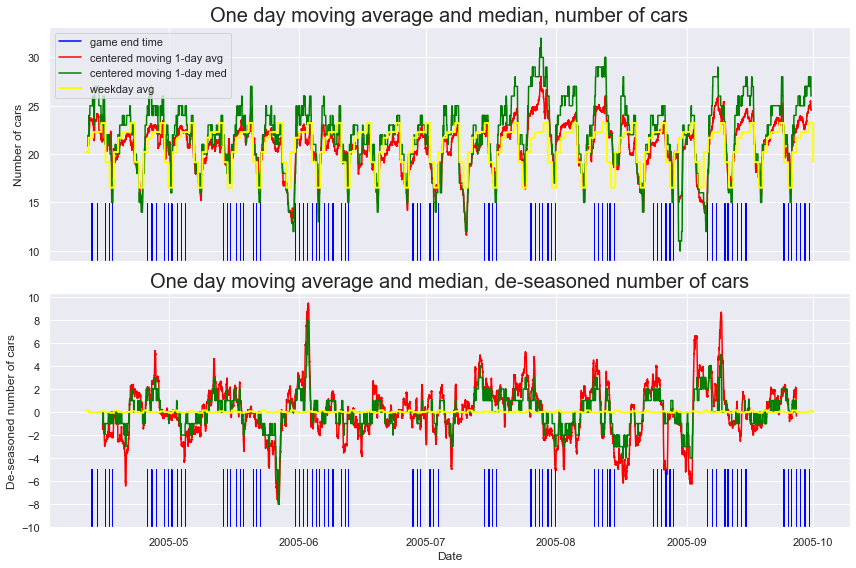

In [16]:
# comparing the moving averages and medians, and the weekday average
# to game_ending? intervals for both the original number of cars
# and the de-seasoned number of cars
fig, ax = plt.subplots(2, 1, figsize=(12,8), sharex=True)

x = dodgers_df["number_of_cars"][dodgers_df["game_ending?"]==True].index

sns.lineplot(x=dodgers_df.index, y=dodgers_df["oneDay_movingAvg"], linestyle="-", color="red", ax=ax[0])
sns.lineplot(x=dodgers_df.index, y=dodgers_df["oneDay_movingMed"], linestyle="-", color="green", ax=ax[0])
sns.lineplot(x=dodgers_df.index, y=dodgers_df["weekdayAvg"], linestyle="-", linewidth=2, color="yellow", ax=ax[0])
sns.rugplot(x=dodgers_df[dodgers_df["game_ending?"]==True].index, height=0.25,
            expand_margins=False, color="blue", ax=ax[0])
ax[0].set_xlabel("Date")
ax[0].set_ylabel("Number of cars")
ax[0].set_title("One day moving average and median, number of cars", size=20)

sns.lineplot(x=dodgers_df.index, y=dodgers_df["deSeason_movingAvg"], linestyle="-", color="red", ax=ax[1])
sns.lineplot(x=dodgers_df.index, y=dodgers_df["deSeason_movingMed"], linestyle="-", color="green", ax=ax[1])
sns.lineplot(x=dodgers_df.index, y=dodgers_df["deSeasonWeekdayAvg"], linestyle="-", color="yellow",
             linewidth=2, ax=ax[1])
sns.rugplot(x=dodgers_df[dodgers_df["game_ending?"]==True].index, height=0.25,
            expand_margins=False, color="blue", ax=ax[1])
ax[1].set_yticks(range(-10, 12, 2))
ax[1].set_xlabel("Date")
ax[1].set_ylabel("De-seasoned number of cars")
ax[1].set_title("One day moving average and median, de-seasoned number of cars", size=20)

# creating the legend
deSblueLine = Line2D([], [], color="blue", marker="None", linestyle="-", label="game end time")
deSredLine = Line2D([], [], color="red", marker="None", linestyle="-", label="centered moving 1-day avg")
deSgreenLine = Line2D([], [], color="green", marker="None", linestyle="-",
                      label="centered moving 1-day med")
deSyellowLine = Line2D([], [], color="yellow", marker="None", linestyle="-", linewidth=2, label="weekday avg")
ax[0].legend(handles=[deSblueLine, deSredLine, deSgreenLine, deSyellowLine], loc="best")

plt.tight_layout()

# Identifying anomalies by using STL from statsmodels.tsa.seasonal

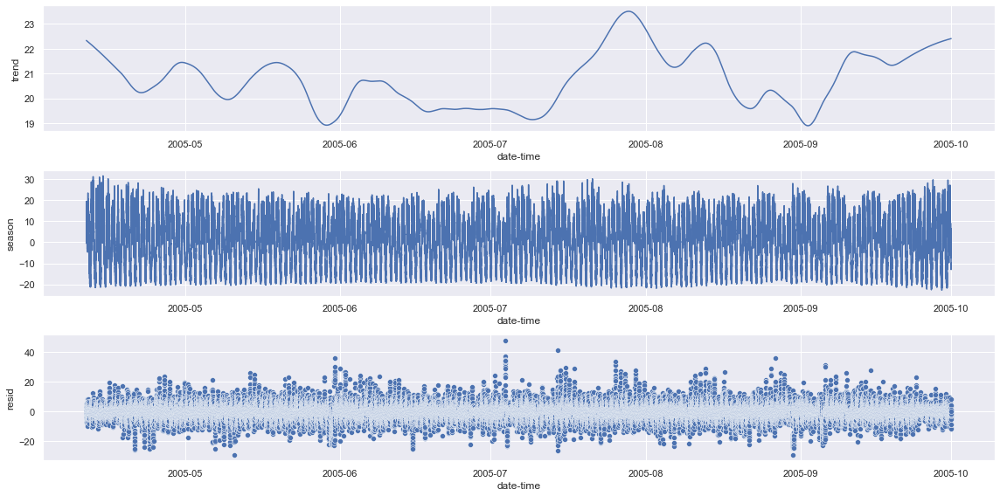

In [17]:
from statsmodels.tsa.seasonal import STL

result_stl = STL(dodgers_df["number_of_cars"], period=2016).fit() # using only a weekly season

# a visual examination of our results
fig, ax = plt.subplots(3, 1, figsize=(16, 8))
sns.lineplot(x=dodgers_df.index, y=result_stl.trend, ax=ax[0])
sns.lineplot(x=result_stl.seasonal.index, y=result_stl.seasonal, ax=ax[1])
sns.scatterplot(x=dodgers_df.index, y=result_stl.resid, ax=ax[2])

plt.tight_layout()

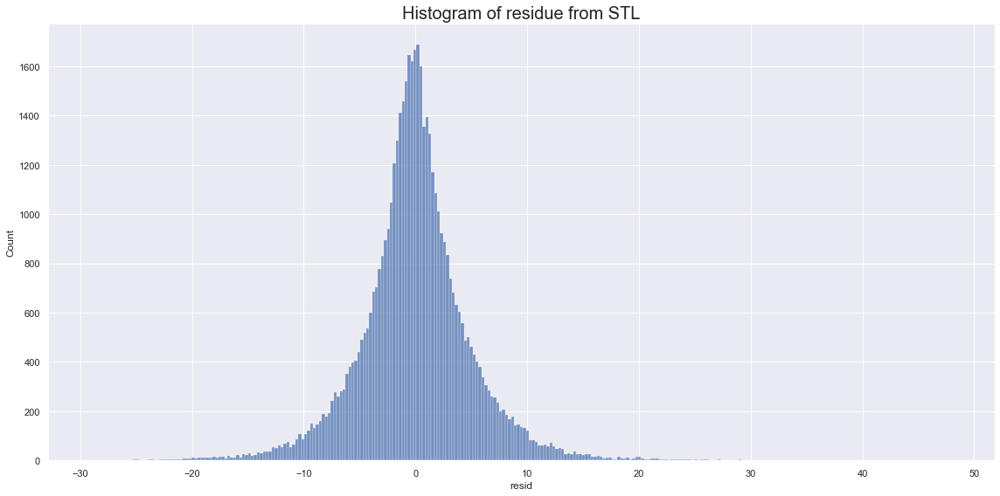

In [18]:
# examining the distribution of the values from
# the residue component
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
sns.histplot(result_stl.resid, ax=ax)
ax.set_title("Histogram of residue from STL", size=20)
plt.tight_layout()

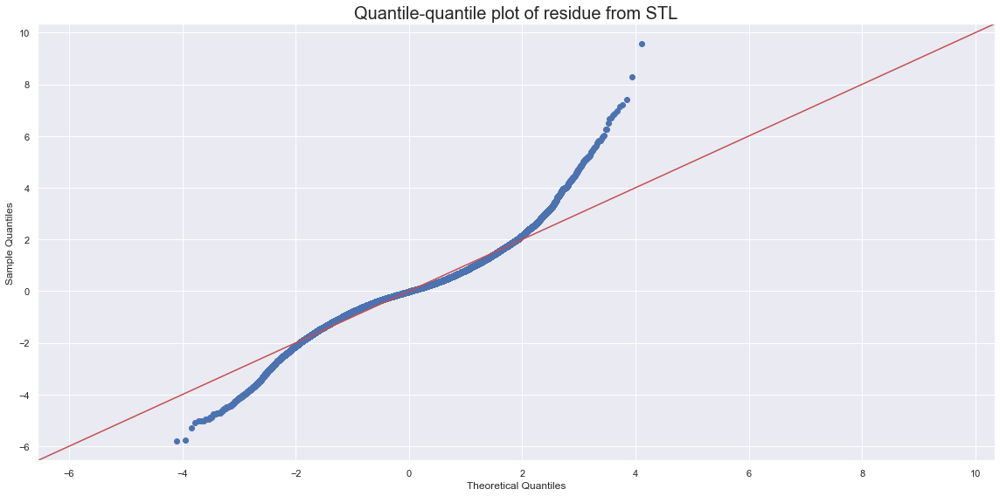

In [19]:
# is it reasonable to assume that the residue values
# come from a normal distribution?
from statsmodels.graphics.gofplots import qqplot

fig, ax = plt.subplots(1, 1, figsize=(16,8))
qqplot(result_stl.resid, fit=True, line="45", ax=ax)
ax.set_title("Quantile-quantile plot of residue from STL", size=20)
plt.tight_layout()

In [20]:
# We assume that the residue values come from a normal distribution
# Calculating the mean and standard deviation of these values
# we identify any values lying outside of two standard deviations 
# from the mean as corresponding to a point outlier. Thus about 5%
# of the residue values represent point outliers
m, s = np.mean(result_stl.resid), np.std(result_stl.resid, ddof=1)

dodgers_df["residue_stl"] = result_stl.resid
dodgers_df["outlier_stl"] = np.abs(dodgers_df["residue_stl"] - m) > 2*s

In [21]:
dodgers_df["outlier_stl"].isna().any()

False

In [22]:
# proportion of point outliers using the STL model
dodgers_df["outlier_stl"][dodgers_df["outlier_stl"]==True].count() / len(dodgers_df)

0.054951241580375995

# A visual inspection of STL model results

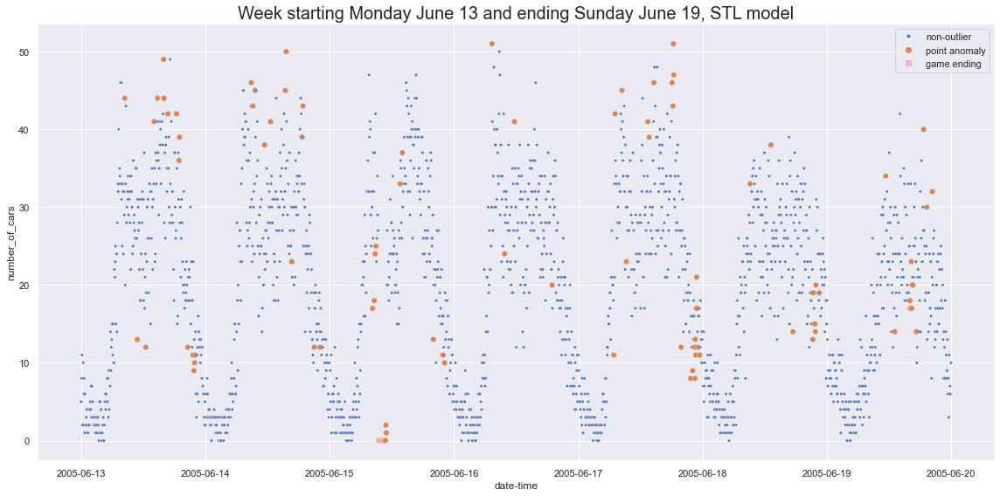

In [23]:
fig, ax = plt.subplots(1, 1, figsize=(16,8))
sns.scatterplot(x=dodgers_df.loc["2005-06-13 00:00:00":"2005-06-19 23:59:59"].index,
                y=dodgers_df.loc["2005-06-13 00:00:00":"2005-06-19 23:59:59"]["number_of_cars"],
                hue=dodgers_df.loc["2005-06-13 00:00:00":"2005-06-19 23:59:59"]["outlier_stl"],
                size=dodgers_df.loc["2005-06-13 00:00:00":"2005-06-19 23:59:59"]["outlier_stl"],
                sizes={False:10, True:40},
                legend=False,
                ax=ax)

df = dodgers_df.loc["2005-06-13 00:00:00":"2005-06-19 23:59:59"]
df = df[df["game_ending?"]==True]
sns.rugplot(x=df.index, color="red", height=1, alpha=0.2, ax=ax, expand_margins=False)

# making the legend
blueDot = Line2D([], [], color=sns.color_palette()[0], marker="o", markersize=3, linestyle="None", label="non-outlier")
pinkDot = Line2D([], [], color=sns.color_palette()[1], marker="o", linestyle="None", label="point anomaly")
redSquare = Line2D([], [], color="red", alpha=0.2, marker="s", linestyle="None", label="game ending")
ax.legend(handles=[blueDot, pinkDot, redSquare])

ax.set_title("Week starting Monday June 13 and ending Sunday June 19, STL model", size=20)
plt.tight_layout()

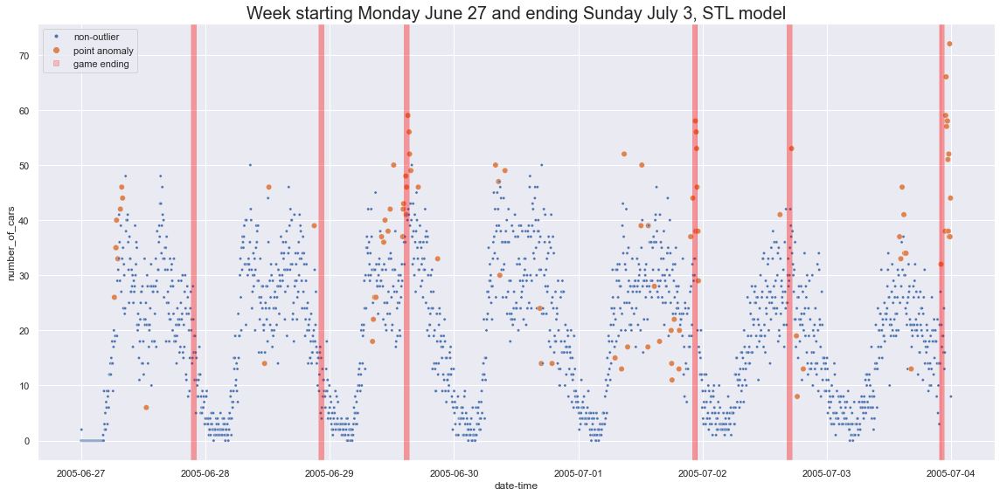

In [24]:
fig, ax = plt.subplots(1, 1, figsize=(16,8))
sns.scatterplot(x=dodgers_df.loc["2005-06-27 00:00:00":"2005-07-03 23:59:59"].index,
                y=dodgers_df.loc["2005-06-27 00:00:00":"2005-07-03 23:59:59"]["number_of_cars"],
                hue=dodgers_df.loc["2005-06-27 00:00:00":"2005-07-03 23:59:59"]["outlier_stl"],
                size=dodgers_df.loc["2005-06-27 00:00:00":"2005-07-03 23:59:59"]["outlier_stl"],
                sizes={False:10, True:40},
                legend=False,
                ax=ax)

df = dodgers_df.loc["2005-06-27 00:00:00":"2005-07-03 23:59:59"]
df = df[df["game_ending?"]==True]
sns.rugplot(x=df.index, color="red", height=1, alpha=0.2, ax=ax, expand_margins=False)

ax.set_title("Week starting Monday June 27 and ending Sunday July 3, STL model", size=20)

# making the legend
ax.legend(handles=[blueDot, pinkDot, redSquare])


plt.tight_layout()

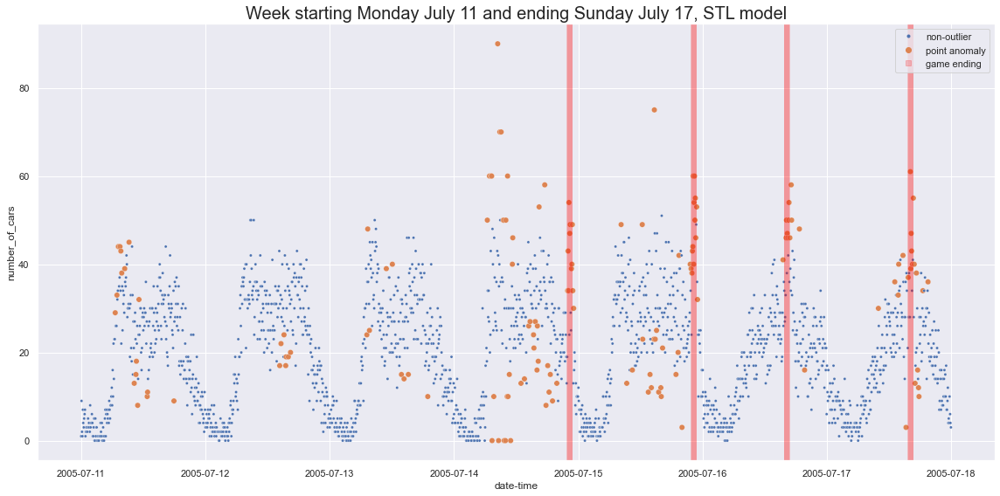

In [25]:
fig, ax = plt.subplots(1, 1, figsize=(16,8))
sns.scatterplot(x=dodgers_df.loc["2005-07-11 00:00:00":"2005-07-17 23:59:59"].index,
                y=dodgers_df.loc["2005-07-11 00:00:00":"2005-07-17 23:59:59"]["number_of_cars"],
                hue=dodgers_df.loc["2005-07-11 00:00:00":"2005-07-17 23:59:59"]["outlier_stl"],
                size=dodgers_df.loc["2005-07-11 00:00:00":"2005-07-17 23:59:59"]["outlier_stl"],
                sizes={False:10, True:40},
                legend=False,
                ax=ax)

df = dodgers_df.loc["2005-07-11 00:00:00":"2005-07-17 23:59:59"]
df = df[df["game_ending?"]==True]
sns.rugplot(x=df.index, color="red", height=1, alpha=0.2, ax=ax, expand_margins=False)

ax.set_title("Week starting Monday July 11 and ending Sunday July 17, STL model", size=20)

# making the legend
ax.legend(handles=[blueDot, pinkDot, redSquare])


plt.tight_layout()

# Identifying anomalies by using MSTL from statsmodels.tsa.seasonal

In [26]:
from statsmodels.tsa.seasonal import MSTL

# using MSTL to decompose dodgers_df["number_of_cars"]
# into trend, daily season, weekly season, and residue
# components
result_mstl = MSTL(dodgers_df["number_of_cars"],
              periods=[288, 288*7]).fit()

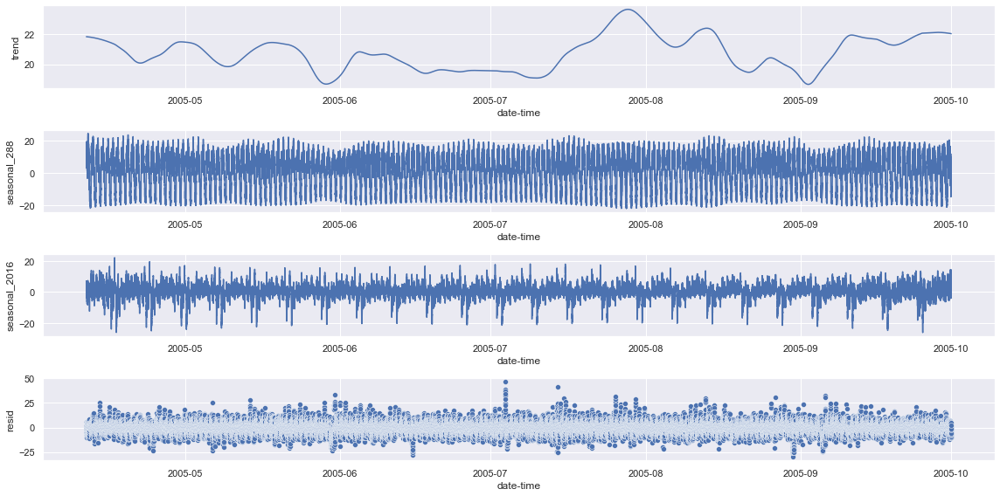

In [27]:
# a visual examination of our results
fig, ax = plt.subplots(4, 1, figsize=(16, 8))
sns.lineplot(x=dodgers_df.index, y=result_mstl.trend, ax=ax[0])
sns.lineplot(x=result_mstl.seasonal.index, y=result_mstl.seasonal["seasonal_288"], ax=ax[1]) # daily season
sns.lineplot(x=result_mstl.seasonal.index, y=result_mstl.seasonal["seasonal_2016"], ax=ax[2]) # weekly season
sns.scatterplot(x=dodgers_df.index, y=result_mstl.resid, ax=ax[3])

plt.tight_layout()

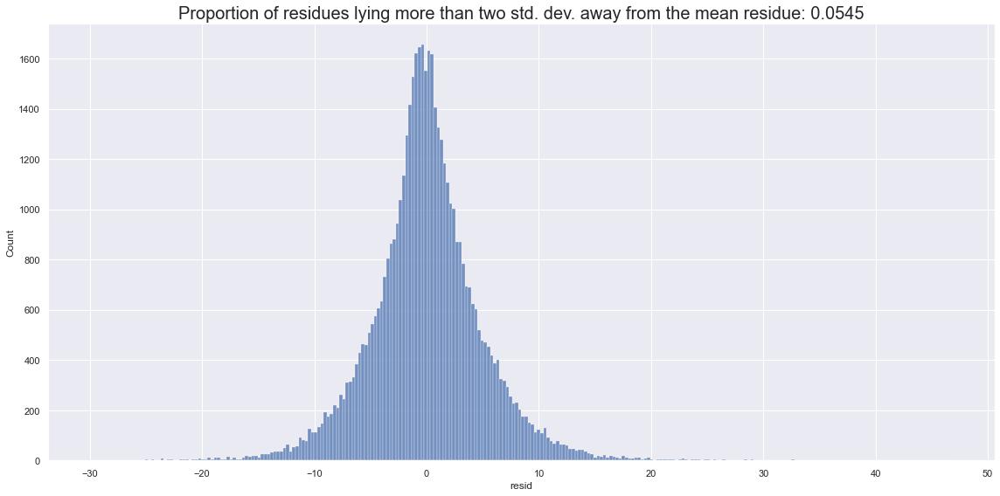

In [28]:
# Calculating the mean and standard deviation of the residue values
# we identify any values lying outside of two standard deviations 
# from the mean as corresponding to a point outlier.
m, s = np.mean(result_mstl.resid), np.std(result_mstl.resid, ddof=1)

dodgers_df["residue_mstl"] = result_mstl.resid # a new column showing the residues
dodgers_df["outlier_mstl"] = np.abs(dodgers_df["residue_mstl"] - m) > 2*s # a new column labeling point anomalies

# proportion of point outliers using the MSTL model
propMSTL = dodgers_df["outlier_mstl"][dodgers_df["outlier_mstl"]==True].count() / len(dodgers_df)

# examining the distribution of the values from
# the residue component
fig, ax = plt.subplots(1, 1, figsize=(16, 8))
sns.histplot(result_mstl.resid, ax=ax)
ax.set_title(f"Proportion of residues lying more than two std. dev. away from the mean residue: {round(propMSTL,4)}",
             size=20)
plt.tight_layout()

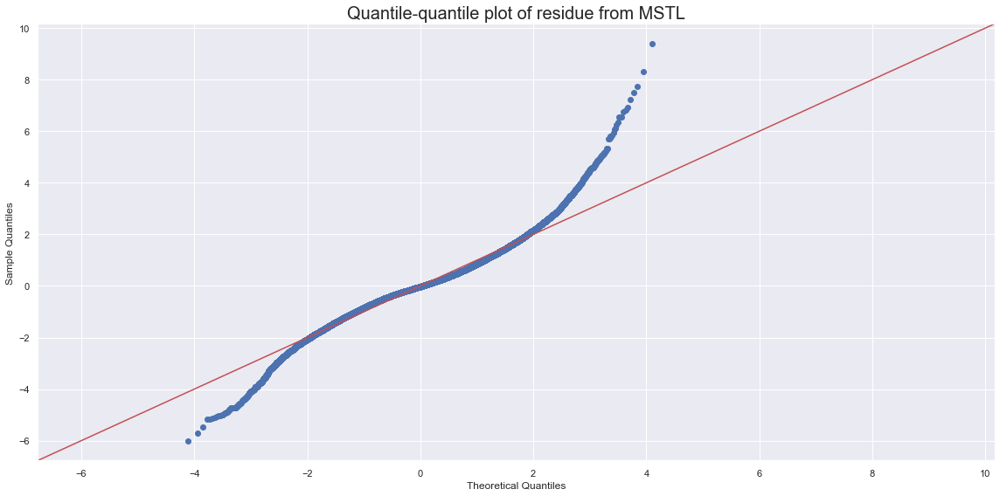

In [29]:
# is it reasonable to assume that the residue values
# come from a normal distribution?

fig, ax = plt.subplots(1, 1, figsize=(16,8))
qqplot(result_mstl.resid, fit=True, line="45", ax=ax)
ax.set_title("Quantile-quantile plot of residue from MSTL", size=20)
plt.tight_layout()

# Exploring the use of an LSTM NN to predict anomalies

In [30]:
# Finding the largest span of time with no games ending
# We will use this interval to train the model

gameEndIndex = dodgers_df[dodgers_df["game_ending?"]==True].index
gameEndDict = dict()

for i in range(1, len(gameEndIndex)):
    gameEndDict[(gameEndIndex[i-1], gameEndIndex[i])] = gameEndIndex[i] - gameEndIndex[i-1]
    
gapList = gameEndDict.values()    
timeMax = max(gapList)

gameEndRevDict = dict()
for thing in gameEndDict.items():
    gameEndRevDict[thing[1]] = thing[0]
    
print(timeMax, gameEndRevDict[timeMax])

15 days 04:55:00 (Timestamp('2005-06-12 16:15:00'), Timestamp('2005-06-27 21:10:00'))


In [31]:
# Finding the third largest span of time with no games ending
# The second largest span contains the 4th of July holiday
# We will use this interval to test the model

for i in range(2):
    takeAway = [timeMax]
    gapList = [x for x in gapList if x not in takeAway]
    timeMax = max(gapList)

print(timeMax, gameEndRevDict[timeMax])

9 days 05:30:00 (Timestamp('2005-08-14 15:50:00'), Timestamp('2005-08-23 21:20:00'))


In [32]:
# preprocessing for LSTM
from sklearn.preprocessing import MinMaxScaler

def superviseTime(data): # add a column with time series pushed down by 12 places for t-1hour forecasting
    secondCol = data
    firstCol = data.shift(12)
    df = pd.DataFrame(pd.concat((firstCol, secondCol), axis=1))
    df.fillna(0, inplace=True)
    return df

modelTrain = dodgers_df.loc["2005-06-12 18:00:00":"2005-06-27 18:00:00"]["number_of_cars"] # 15 days
modelTest = dodgers_df.loc["2005-08-14 18:00:00":"2005-08-23 18:00:00"]["number_of_cars"] # 9 days

# reshaping the training and test sets for t-1hour forecasting
modelTrain = superviseTime(modelTrain)
modelTrain.columns = ["noc_t-12", "noc_t"]

modelTest = superviseTime(modelTest)
modelTest.columns = ["noc_t-12", "noc_t"]

print(modelTrain.head(24))
print(modelTest.head(24))

                     noc_t-12  noc_t
date-time                           
2005-06-12 18:00:00       0.0   32.0
2005-06-12 18:05:00       0.0   21.0
2005-06-12 18:10:00       0.0   16.0
2005-06-12 18:15:00       0.0   30.0
2005-06-12 18:20:00       0.0   24.0
2005-06-12 18:25:00       0.0   19.0
2005-06-12 18:30:00       0.0   23.0
2005-06-12 18:35:00       0.0   21.0
2005-06-12 18:40:00       0.0   24.0
2005-06-12 18:45:00       0.0   28.0
2005-06-12 18:50:00       0.0   31.0
2005-06-12 18:55:00       0.0   12.0
2005-06-12 19:00:00      32.0   20.0
2005-06-12 19:05:00      21.0   34.0
2005-06-12 19:10:00      16.0   19.0
2005-06-12 19:15:00      30.0   14.0
2005-06-12 19:20:00      24.0   20.0
2005-06-12 19:25:00      19.0   24.0
2005-06-12 19:30:00      23.0   18.0
2005-06-12 19:35:00      21.0   27.0
2005-06-12 19:40:00      24.0   14.0
2005-06-12 19:45:00      28.0   28.0
2005-06-12 19:50:00      31.0   13.0
2005-06-12 19:55:00      12.0   23.0
                     noc_t-12  noc_t
d

In [33]:
# scaling training and test sets so that number_of_cars values are all between -1 and 1
scaler = MinMaxScaler(feature_range=(-1,1))
modelTrain["noc_t-12"] = scaler.fit_transform(modelTrain["noc_t-12"].to_numpy().reshape(-1,1))
modelTrain["noc_t"] = scaler.fit_transform(modelTrain["noc_t"].to_numpy().reshape(-1,1))

modelTest["noc_t-12"] = scaler.fit_transform(modelTest["noc_t-12"].to_numpy().reshape(-1,1))
modelTest["noc_t"] = scaler.fit_transform(modelTest["noc_t"].to_numpy().reshape(-1,1))

In [34]:
train = modelTrain.to_numpy()
X_train, y_train = train[:, 0:-1], train[:, -1]
X_train, y_train = X_train[:4320], y_train[:4320] # to accommodate a batch size of 144
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])

test = modelTest.to_numpy()
X_test, y_test = test[:, 0:-1], test[:, -1]
X_test, y_test = X_test[:2592], y_test[:2592] # to accommodate a batch_size of 144
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

In [35]:
# tuning hyperparameters for the LSTM model
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense
from keras_tuner.tuners import BayesianOptimization
from keras_tuner.engine.hyperparameters import HyperParameters

def build_model(hp): #building the model
    model = Sequential()
    model.add(LSTM(hp.Int("input_unit", min_value=32, max_value=512, step=32),
                   batch_input_shape=(144,1,1), return_sequences=True, stateful=True))
    for i in range(hp.Int("n_layers", 1, 2)):
        model.add(LSTM(hp.Int(f"lstm_{i}_units", min_value=32, max_value=512, step=32),
                      return_sequences=True, stateful=True))
    model.add(LSTM(hp.Int("last_hidden_layer", min_value=32, max_value=512, step=32),
                   stateful=True))
    model.add(Dropout(hp.Float("Dropout_rate", min_value=0, max_value=0.5, step=0.1)))
    model.add(Dense(1))
    model.compile(loss="mean_squared_error",
                  optimizer=hp.Choice("optimizer", values=["rmsprop", "adam"]),
                  metrics=[keras.metrics.RootMeanSquaredError(name="rmse")])
    return model

# building the tuner
tuner = BayesianOptimization(build_model,
                             overwrite=True,
                             objective="val_loss",
                             max_trials=50,
                             executions_per_trial=1,
                             project_name="LSTM_model")

# implementing the tuner search
tuner.search(X_train, y_train, epochs=50, batch_size=144, shuffle=False, validation_data=(X_test, y_test)) 

Trial 50 Complete [00h 01m 21s]
val_loss: 0.0781833603978157

Best val_loss So Far: 0.06913615018129349
Total elapsed time: 00h 59m 44s
INFO:tensorflow:Oracle triggered exit


In [36]:
from keras.models import save_model, load_model

LSTM_model = tuner.get_best_models(num_models=1)[0]
LSTM_model.save("LSTM_model")

INFO:tensorflow:Assets written to: LSTM_model\assets


INFO:tensorflow:Assets written to: LSTM_model\assets


In [37]:
LSTM_model = load_model("LSTM_model")

In [38]:
LSTM_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (144, 1, 64)              16896     
                                                                 
 lstm_1 (LSTM)               (144, 1, 288)             406656    
                                                                 
 lstm_2 (LSTM)               (144, 1, 96)              147840    
                                                                 
 lstm_3 (LSTM)               (144, 320)                533760    
                                                                 
 dropout (Dropout)           (144, 320)                0         
                                                                 
 dense (Dense)               (144, 1)                  321       
                                                                 
Total params: 1,105,473
Trainable params: 1,105,473
Non-

In [39]:
from sklearn.metrics import mean_squared_error

# evaluating the performance of the model on the training set

y_train_pred = LSTM_model.predict(X_train, batch_size=144)

# unscaling y_train and y_train_pred
y_train_pred = scaler.inverse_transform(y_train_pred.reshape(-1,1))
y_train = scaler.inverse_transform(y_train.reshape(-1,1))

mse_train = np.sqrt(mean_squared_error(y_train_pred, y_train))
print(f"Mean squared error on the training set is {mse_train}")

# evaluating the performance of the model on the test set

y_test_pred = LSTM_model.predict(X_test, batch_size=144)

# unscaling y_test and y_test_pred
y_test_pred = scaler.inverse_transform(y_test_pred.reshape(-1,1))
y_test = scaler.inverse_transform(y_test.reshape(-1,1))

mse_test = np.sqrt(mean_squared_error(y_test_pred, y_test))
print(f"Mean squared error on the test set is {mse_test}")

30/30 [==============================] - 2s 12ms/step
Mean squared error on the training set is 6.811294360263792
18/18 [==============================] - 0s 13ms/step
Mean squared error on the test set is 7.341516397974316


In [40]:
# creating a column for dodgers_df showing the LSTM network model predictions
topNum = dodgers_df["number_of_cars"].to_numpy()[:-55] # taking 55 measurements out from the end; batch size is 144
botNum = dodgers_df["number_of_cars"].to_numpy()[55:] # taking 55 measurements out from the beginning, same reason

topNum = scaler.fit_transform(topNum.reshape(-1,1))
botNum = scaler.fit_transform(botNum.reshape(-1,1))

topNum = LSTM_model.predict(topNum.reshape(-1,1,1), batch_size=144)
botNum = LSTM_model.predict(botNum.reshape(-1,1,1), batch_size=144)

topNum = scaler.inverse_transform(topNum.reshape(-1,1))
botNum = scaler.inverse_transform(botNum.reshape(-1,1))

dodgers_df["lstm_pred"] = np.concatenate((topNum, botNum[-55:])) # combining topNum and botNum so we have predictions
                                                                # corresponding to each number_of_cars value

# prediction errors
dodgers_df["lstm_error"] = dodgers_df["number_of_cars"] - dodgers_df["lstm_pred"]

eBar = np.mean(dodgers_df["lstm_error"])
eS = np.std(dodgers_df["lstm_error"], ddof=1)

# defining the threshold for point anomalies
dodgers_df["lstm_out"] = np.abs(dodgers_df["lstm_error"] - eBar) > 2*eS

outlier = len(dodgers_df[dodgers_df["lstm_out"]==True])/len(dodgers_df)

345/345 [==============================] - 4s 12ms/step


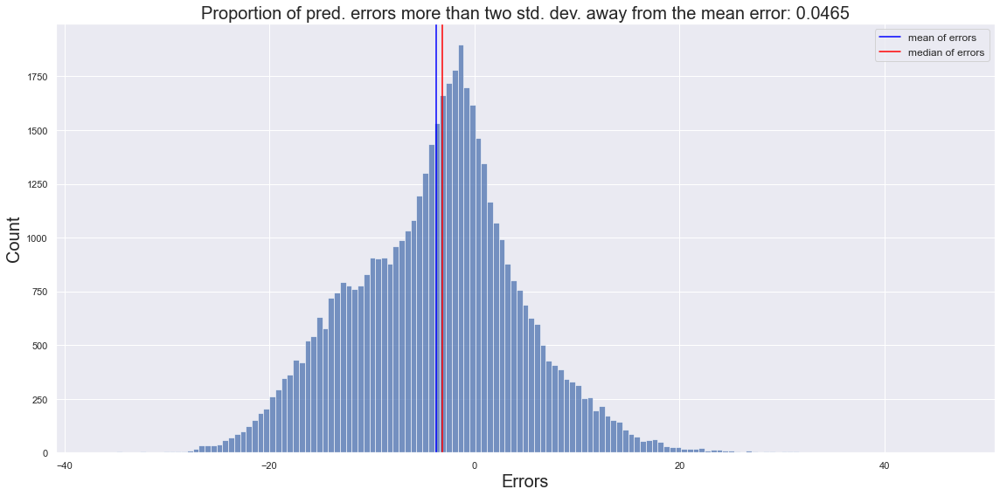

In [41]:
# the distribution of prediction errors
fig, ax = plt.subplots(1, 1, figsize=(16,8))
sns.histplot(data=dodgers_df["lstm_error"], legend=None, ax=ax)
ax.axvline(np.median(dodgers_df["lstm_error"]), color="red")
ax.axvline(eBar, color="blue")

ax.set_title(f"Proportion of pred. errors more than two std. dev. away from the mean error: {round(outlier,4)}",
             size=20)
ax.set_ylabel("Count", size=20)
ax.set_xlabel("Errors", size=20)

# making the legend
blueLine = Line2D([], [], color="blue", marker="None", linestyle="-", label="mean of errors")
redLine = Line2D([], [], color="red", marker="None", linestyle="-", label="median of errors")
ax.legend(handles=[blueLine, redLine], fontsize="large")

plt.tight_layout()

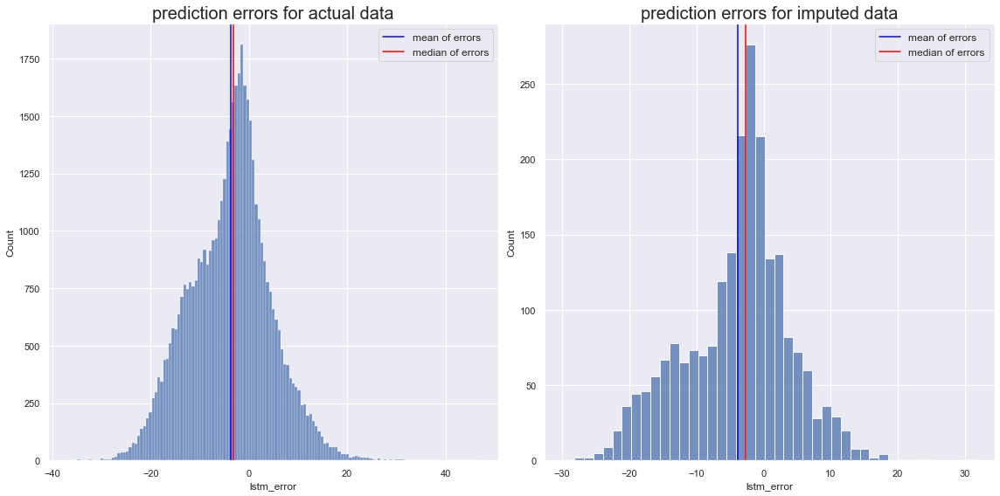

In [42]:
# examining distribution errors for imputed data and non-imputed data separately

imputed = dodgers_df[dodgers_df["data"]=="imputed"]["lstm_error"]
actual = dodgers_df[dodgers_df["data"]=="actual"]["lstm_error"]

fig, ax = plt.subplots(1, 2, figsize=(16, 8))

sns.histplot(data=actual, legend=None, ax=ax[0])
sns.histplot(data=imputed, legend=None, ax=ax[1])

ax[0].set_title("prediction errors for actual data", size=20)
ax[0].axvline(np.median(actual), color="red")
ax[0].axvline(np.mean(actual), color="blue")
ax[1].set_title("prediction errors for imputed data", size=20)
ax[1].axvline(np.median(imputed), color="red")
ax[1].axvline(np.mean(imputed), color="blue")

ax[0].legend(handles=[blueLine, redLine], fontsize="large", loc="best")
ax[1].legend(handles=[blueLine, redLine], fontsize="large", loc="best")

plt.tight_layout()

C:\Users\Owner\AppData\Local\Temp\ipykernel_3240\3009888989.py:18: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(2, 1, figsize=(16,10), sharex=True)


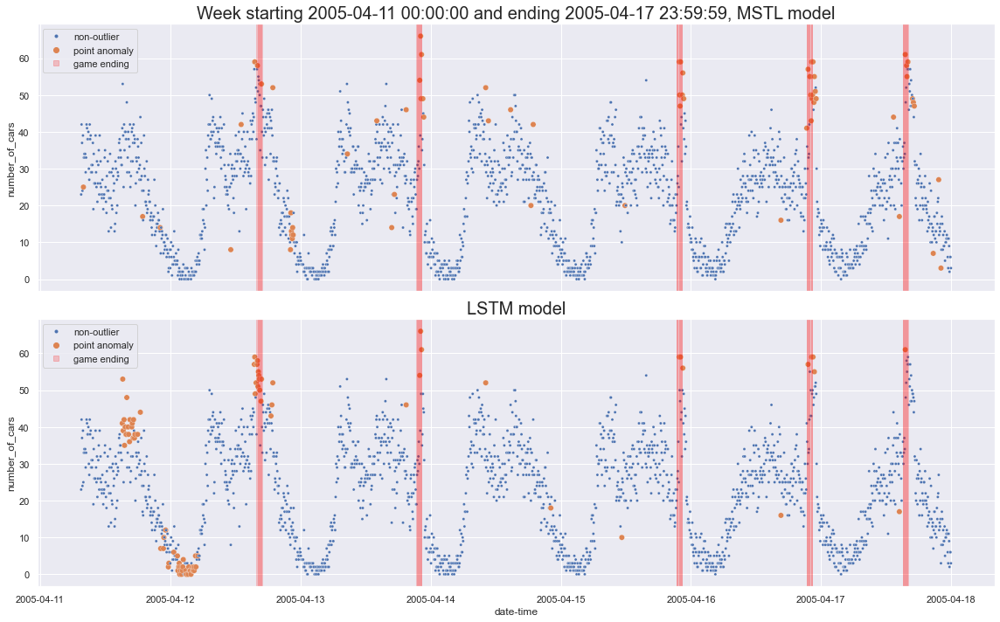

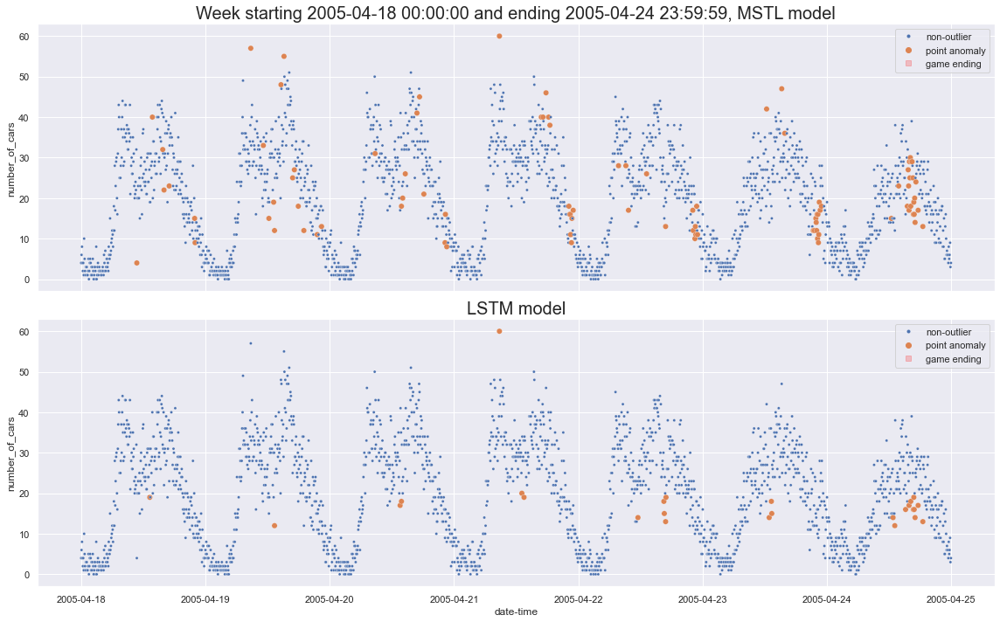

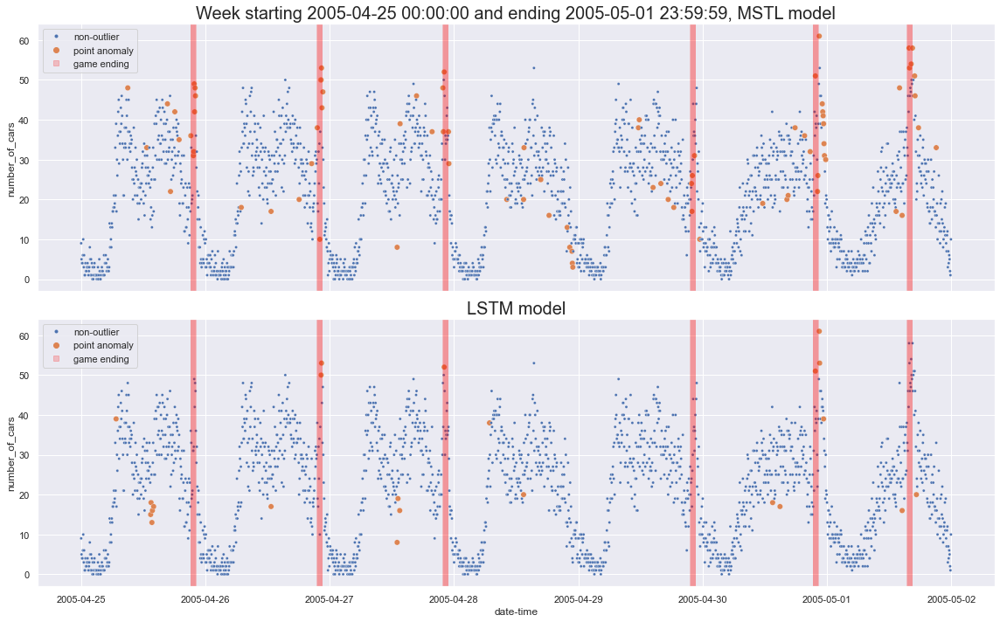

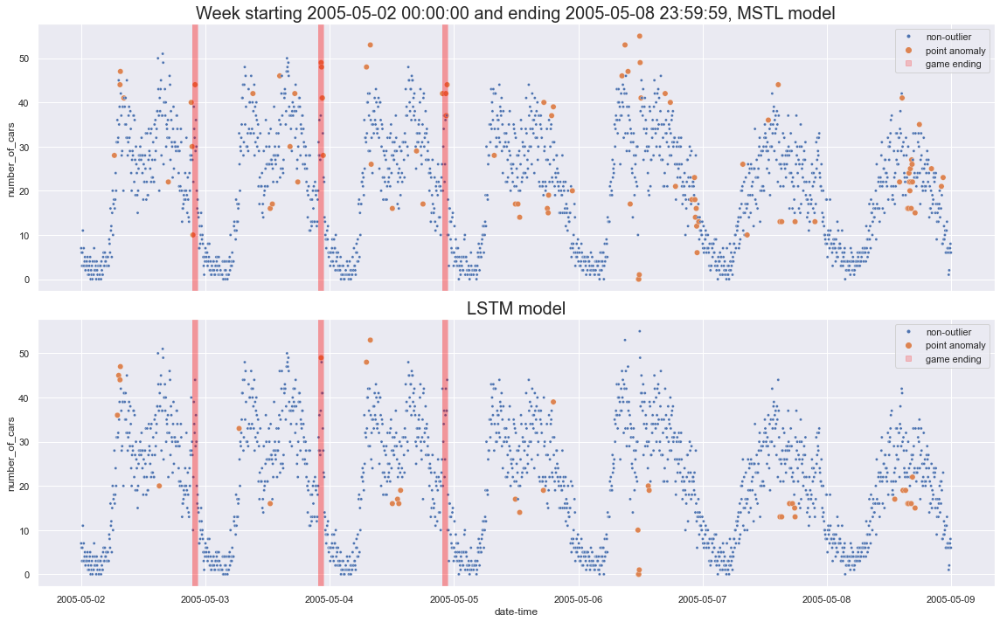

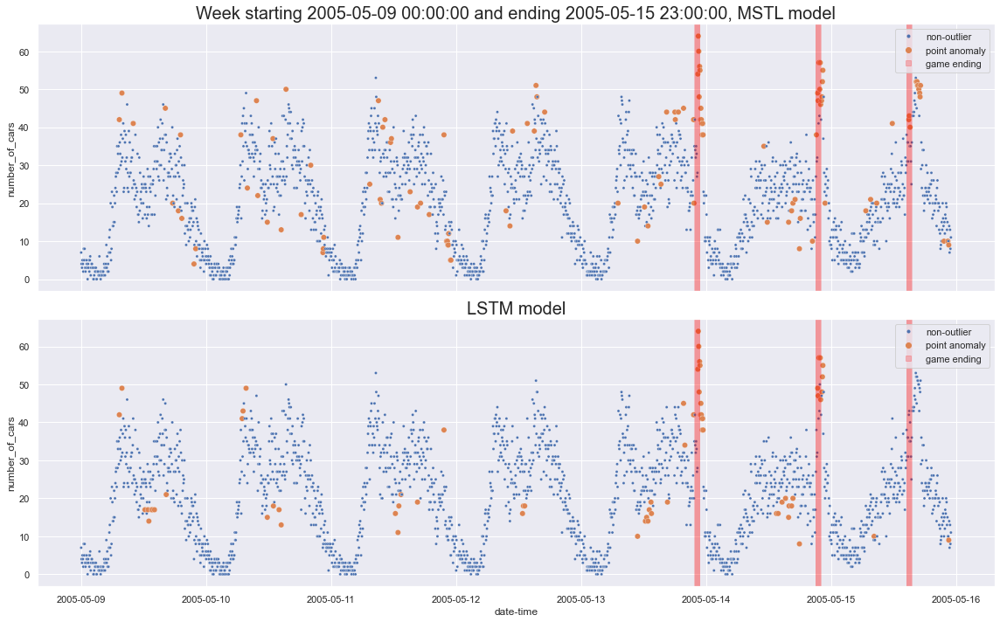

...

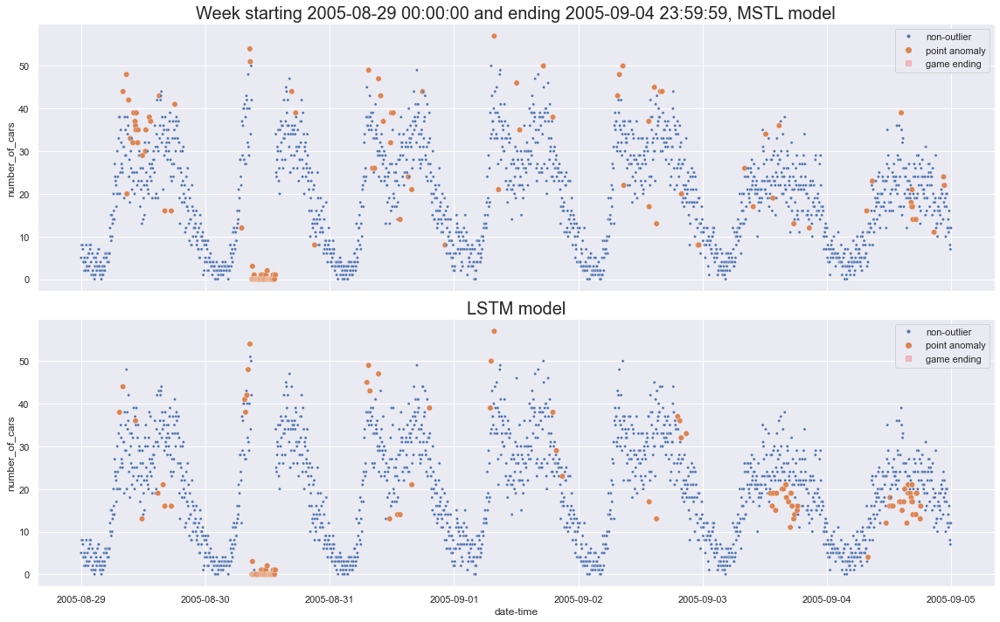

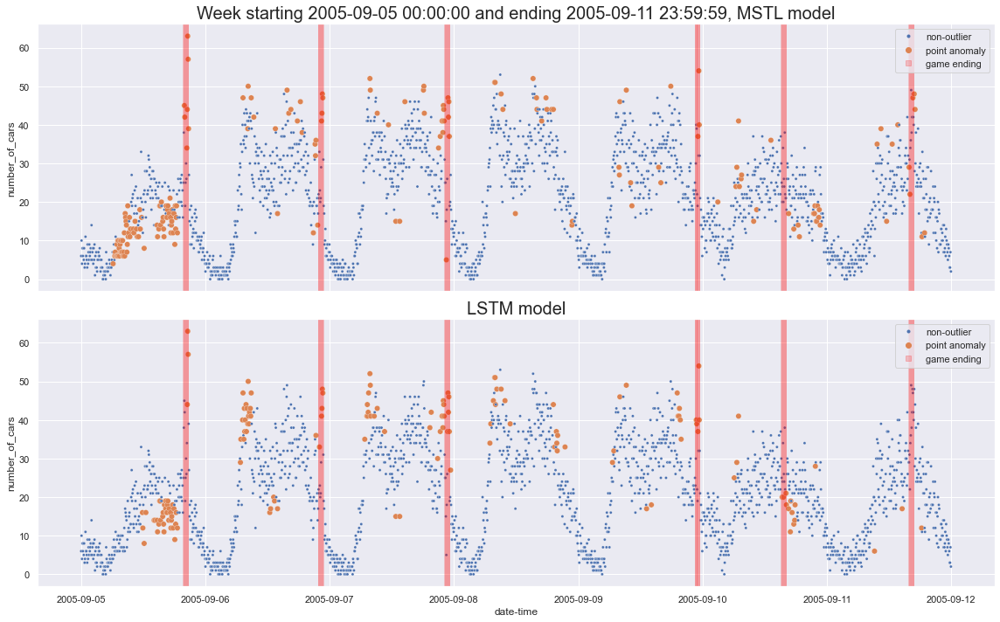

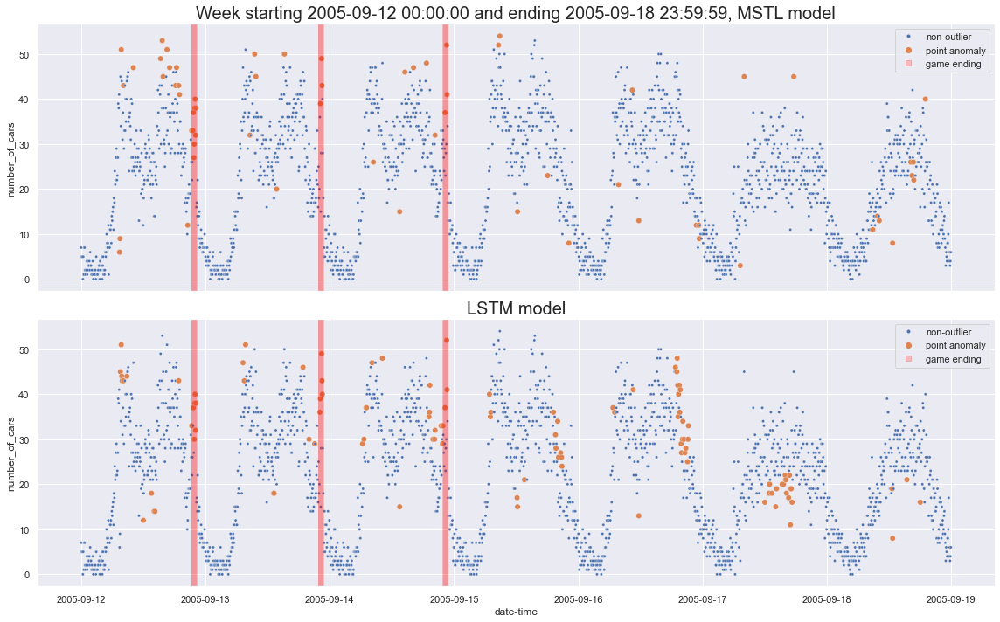

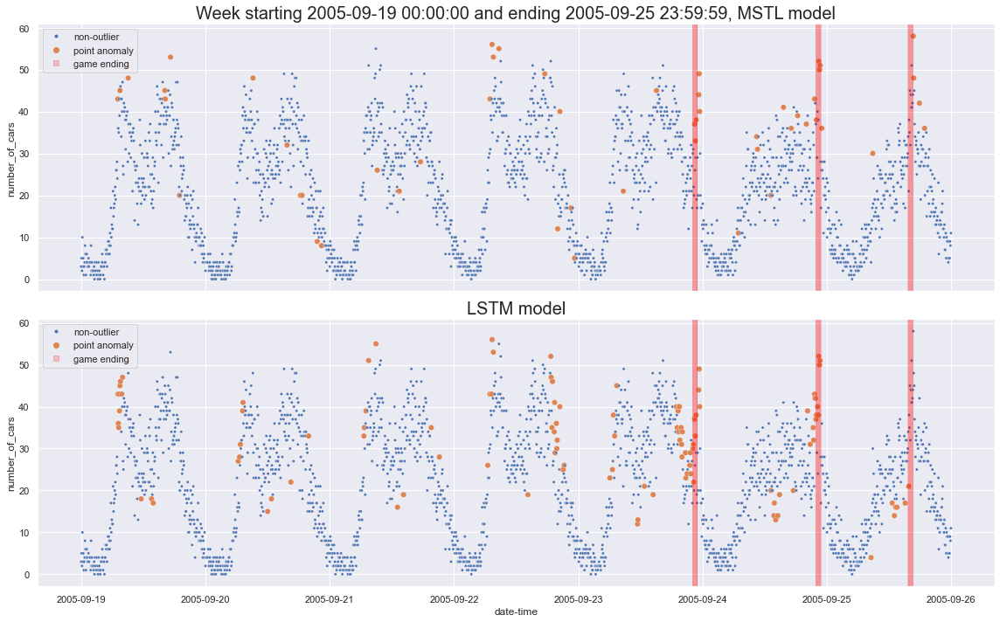

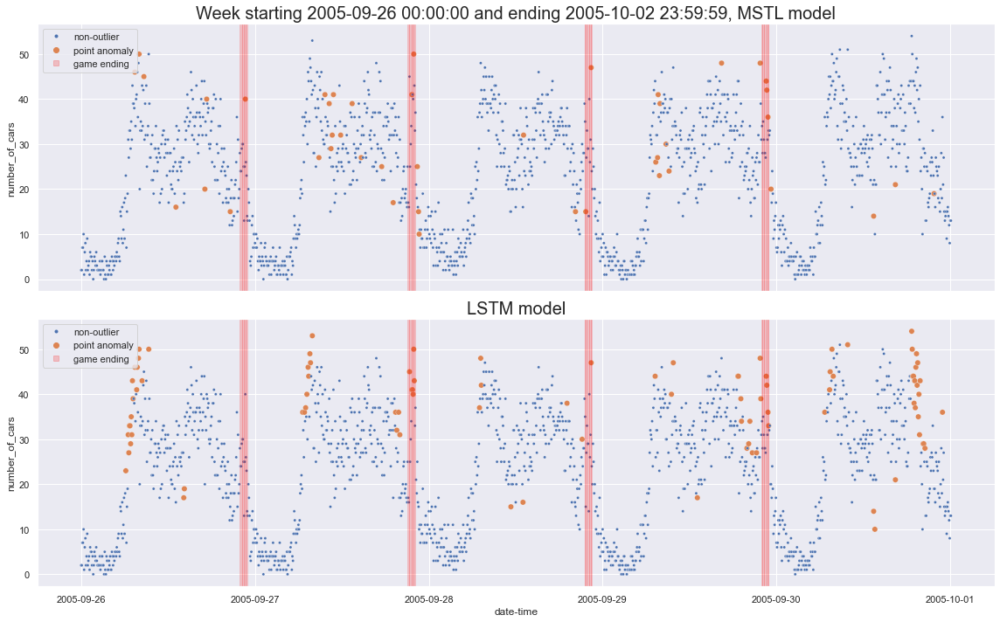

In [43]:
# a week by week visual comparison of the performance of the MSTL statistical model
# and the LSTM network
weekList = [("2005-04-11 00:00:00","2005-04-17 23:59:59"), ("2005-04-18 00:00:00","2005-04-24 23:59:59"),
           ("2005-04-25 00:00:00","2005-05-01 23:59:59"), ("2005-05-02 00:00:00","2005-05-08 23:59:59"),
           ("2005-05-09 00:00:00","2005-05-15 23:00:00"), ("2005-05-16 00:00:00","2005-05-22 23:59:59"),
           ("2005-05-23 00:00:00","2005-05-29 23:59:59"), ("2005-05-30 00:00:00","2005-06-05 23:59:59"),
           ("2005-06-06 00:00:00","2005-06-12 23:59:59"), ("2005-06-13 00:00:00","2005-06-19 23:59:59"),
           ("2005-06-20 00:00:00","2005-06-26 23:59:59"), ("2005-06-27 00:00:00","2005-07-03 23:59:59"),
           ("2005-07-04 00:00:00","2005-07-10 23:59:59"), ("2005-07-11 00:00:00","2005-07-17 23:59:59"),
           ("2005-07-18 00:00:00","2005-07-24 23:59:59"), ("2005-07-25 00:00:00","2005-07-31 23:59:59"),
           ("2005-08-01 00:00:00","2005-08-07 23:59:59"), ("2005-08-08 00:00:00","2005-08-14 23:59:59"),
           ("2005-08-15 00:00:00","2005-08-21 23:59:59"), ("2005-08-22 00:00:00","2005-08-28 23:59:59"),
           ("2005-08-29 00:00:00","2005-09-04 23:59:59"), ("2005-09-05 00:00:00","2005-09-11 23:59:59"),
           ("2005-09-12 00:00:00","2005-09-18 23:59:59"), ("2005-09-19 00:00:00","2005-09-25 23:59:59"),
           ("2005-09-26 00:00:00","2005-10-02 23:59:59")]

for string in weekList:
    fig, ax = plt.subplots(2, 1, figsize=(16,10), sharex=True)
    sns.scatterplot(x=dodgers_df.loc[string[0]:string[1]].index,
                    y=dodgers_df.loc[string[0]:string[1]]["number_of_cars"],
                    hue=dodgers_df.loc[string[0]:string[1]]["outlier_mstl"],
                    size=dodgers_df.loc[string[0]:string[1]]["outlier_mstl"],
                    sizes={False:10, True:40},
                    legend=False,
                    ax=ax[0])
    sns.scatterplot(x=dodgers_df.loc[string[0]:string[1]].index,
                    y=dodgers_df.loc[string[0]:string[1]]["number_of_cars"],
                    hue=dodgers_df.loc[string[0]:string[1]]["lstm_out"],
                    size=dodgers_df.loc[string[0]:string[1]]["lstm_out"],
                    sizes={False:10, True:40},
                    legend=False,
                    ax=ax[1])

    df = dodgers_df.loc[string[0]:string[1]]
    df = df[df["game_ending?"]==True]

    sns.rugplot(x=df.index, color="red", height=1, alpha=0.2, ax=ax[0], expand_margins=False)
    sns.rugplot(x=df.index, color="red", height=1, alpha=0.2, ax=ax[1], expand_margins=False)

    ax[0].set_title(f"Week starting {string[0]} and ending {string[1]}, MSTL model", size=20)
    ax[1].set_title("LSTM model", size=20)

    # making the legend
    ax[0].legend(handles=[blueDot, pinkDot, redSquare], loc="best")
    ax[1].legend(handles=[blueDot, pinkDot, redSquare], loc="best")

    plt.tight_layout()